findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.


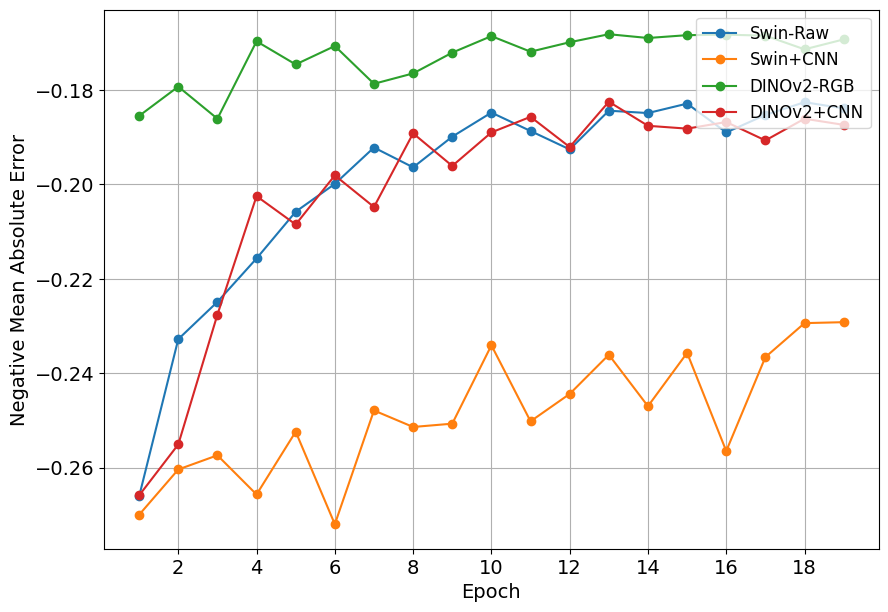

In [24]:
import re
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
def plot_losses(filenames):
    plt.figure(figsize=(10, 7))  # Set up the figure for plotting

    # Iterate over each file
    for filename in filenames:
        # Initialize lists to store epochs and individual losses
        epochs = []
        individual_losses = []

        # Regular expression to capture the required data
        pattern = r"Epoch \[(\d+)/\d+\], Validation Loss: [-\d.]+, Individual Loss: tensor\(\[([-.\d]+)\]"

        # Open and parse the log file
        with open(filename, "r") as file:
            for line in file:
                match = re.search(pattern, line)
                if match:
                    # Extract epoch and individual loss
                    epoch = int(match.group(1))
                    individual_loss = float(match.group(2))
                    epochs.append(epoch)
                    individual_losses.append(-individual_loss)
        # Plot each file's individual loss with a unique label
        plt.plot(range(1,20), individual_losses[:19], marker='o', linestyle='-', label=filename)

    # Customize the plot
    # plt.title("Individual Loss over Epochs for Multiple Files", fontsize=16)  # Larger title font size
    plt.xlabel("Epoch", fontsize=14)  # Larger x-axis label font size
    plt.ylabel("Negative Mean Absolute Error", fontsize=14, fontname="Times New Roman")  # Larger y-axis label font size
    plt.legend(['Swin-Raw','Swin+CNN','DINOv2-RGB','DINOv2+CNN'], fontsize=12,loc="upper right")  # Add a legend to distinguish different files
    plt.grid(True)
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.show()

plot_losses(['submit_slurm/3swin.log','submit_slurm/3swinraw.log', 'submit_slurm/1dino_0.16.log','submit_slurm/1dinoms.log'])

## Visualize Uncertainty

In [67]:
import pandas as pd
blr_train = pd.read_csv('results/blr/Y_trainig_result_Hierarchical_Shrinkage.csv', index_col=0)
blr_test = pd.read_csv('results/blr/Y_test_result_Hierarchical_Shrinkage.csv', index_col=0)
her_X_train = pd.read_csv('results/split_spatial_msuncer_S_1/X_train.csv', index_col=False)
her_y_train = pd.read_csv('results/split_spatial_msuncer_S_1/y_train.csv', index_col=False)
her_X_test = pd.read_csv('results/split_spatial_msuncer_S_1/X_test.csv', index_col=False)
her_y_test = pd.read_csv('results/split_spatial_msuncer_S_1/y_test.csv', index_col=False)
dhs_test = pd.read_csv('../../survey_processing/processed_data/test_fold_1.csv', index_col=False)
her_X = pd.concat([her_X_train, her_X_test])
her_y = pd.concat([her_y_train, her_y_test])
her_all = pd.concat([her_X, her_y], axis=1)
blr_all = pd.concat([blr_train, blr_test])

In [68]:
blr_all.shape

(8650, 3)

In [69]:
imagery_path = '/home/cs-yang3/rds/rds-t2-cs177-KNoCjrg2atA/wp3/data/satellite_imagery/esa_10'
data_folder = '../../survey_processing/processed_data/'
train_df = pd.read_csv(f'{data_folder}train_fold_1.csv')
test_df = pd.read_csv(f'{data_folder}test_fold_1.csv')

available_imagery = []
import os
for d in os.listdir(imagery_path):
    if d[-2] == 'S':
        for f in os.listdir(os.path.join(imagery_path, d)):
            available_imagery.append(os.path.join(imagery_path, d, f))
def is_available(centroid_id):
    for centroid in available_imagery:
        if centroid_id in centroid:
            return True
    return False
train_df = train_df[train_df['CENTROID_ID'].apply(is_available)]
test_df = test_df[test_df['CENTROID_ID'].apply(is_available)]
def filter_contains(query):
        """
        Returns a list of items that contain the given query substring.
        
        Parameters:
            items (list of str): The list of strings to search within.
            query (str): The substring to search for in each item of the list.
            
        Returns:
            list of str: A list containing all items that have the query substring.
        """
        # Use a list comprehension to filter items
        for item in available_imagery:
            if query in item:
                return item
train_df['imagery_path'] = train_df['CENTROID_ID'].apply(filter_contains)
train_df = train_df[train_df['deprived_sev'].notna()]
test_df['imagery_path'] = test_df['CENTROID_ID'].apply(filter_contains)
test_df = test_df[test_df['deprived_sev'].notna()]
train_df['label'] = 'train'
test_df['label'] = 'test'

In [70]:

dhs_all = pd.concat([train_df, test_df])
dhs_all.reset_index(drop=True, inplace=True)
her_all.reset_index(drop=True, inplace=True)
blr_all.reset_index(drop=True, inplace=True)
dhs_with_uncer = pd.concat([dhs_all, blr_all], axis=1)
df = dhs_with_uncer[dhs_with_uncer['COUNTRY'] == 'Rwanda']

In [72]:
df['post_var'] = df['post_sd'] **2

/tmp/ipykernel_803060/3385675022.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [237]:
target = 'post_mean'

In [218]:
# import numpy as np
# import pandas as pd
# import geopandas as gpd
# from shapely.geometry import Point
# import osmnx as ox

# # Obtain Rwanda's boundary in a projected coordinate system for accurate distance measurements
# rwanda_boundary = ox.geocode_to_gdf("Rwanda").to_crs("EPSG:3347")

# # Define the grid resolution (distance between points in meters)
# grid_spacing = 5000  # Adjust as needed

# # Create a grid of points covering Rwanda
# minx, miny, maxx, maxy = rwanda_boundary.total_bounds
# x_coords = np.arange(minx, maxx, grid_spacing)
# y_coords = np.arange(miny, maxy, grid_spacing)
# grid_x, grid_y = np.meshgrid(x_coords, y_coords)
# grid_points = np.vstack([grid_x.ravel(), grid_y.ravel()]).T

# # Convert grid points to a GeoDataFrame
# grid_gdf = gpd.GeoDataFrame(
#     geometry=[Point(xy) for xy in grid_points],
#     crs="EPSG:3347"
# )

# # Keep only points within Rwanda's boundary
# grid_gdf = gpd.sjoin(grid_gdf, rwanda_boundary, how='inner', predicate='within')

# from scipy.spatial import cKDTree

# # Convert your original data to the same CRS
# g_df = gpd.GeoDataFrame(
#     df,
#     crs="EPSG:4326",
#     geometry=gpd.points_from_xy(df["LONGNUM"], df["LATNUM"])
# )
# g_df = g_df.to_crs("EPSG:3347")
# g_df["Easting"], g_df["Northing"] = g_df.geometry.x, g_df.geometry.y

# # Build a KDTree for efficient spatial queries
# data_coords = np.vstack((g_df["Easting"], g_df["Northing"])).T
# tree = cKDTree(data_coords)

# # Coordinates of the grid points
# grid_coords = np.vstack((grid_gdf.geometry.x, grid_gdf.geometry.y)).T

# # For each grid point, find the distance to the nearest data point
# distances, _ = tree.query(grid_coords, k=1)

# # Define a threshold distance (in meters)
# threshold_distance = 20000  # Adjust as needed

# # Identify grid points without nearby data
# no_data_mask = distances > threshold_distance
# no_data_points = grid_gdf[no_data_mask]

# # Baseline value to assign
# baseline_value = 0.05 + np.random.uniform(-0.00005, 0.00005, size=no_data_points.shape[0])

# # Create a DataFrame for baseline values
# baseline_df = pd.DataFrame({
#     'LONGNUM': no_data_points.geometry.x,
#     'LATNUM': no_data_points.geometry.y,
#     target: baseline_value,
#     'label': 'baseline'
# })

# # Convert to GeoDataFrame
# baseline_gdf = gpd.GeoDataFrame(
#     baseline_df,
#     geometry=no_data_points.geometry,
#     crs="EPSG:3347"
# )
# baseline_gdf["Easting"] = baseline_gdf.geometry.x
# baseline_gdf["Northing"] = baseline_gdf.geometry.y
# combined_gdf = pd.concat([g_df, baseline_gdf], ignore_index=True)

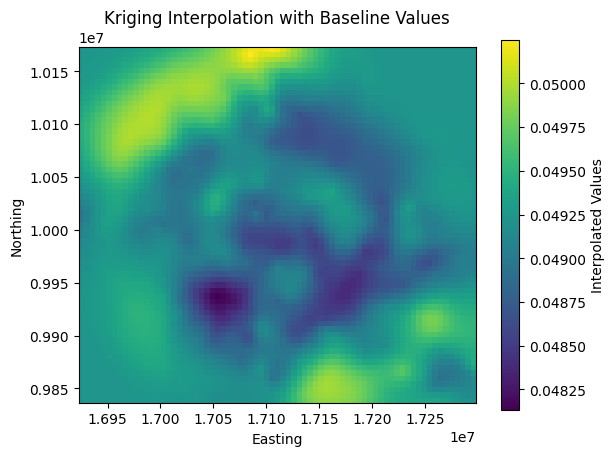

In [222]:
# from pykrige.ok import OrdinaryKriging
# import matplotlib.pyplot as plt

# # Define the kriging grid
# # gridx = np.arange(minx, maxx, grid_spacing)
# # gridy = np.arange(miny, maxy, grid_spacing)
# resolution = 5000  # cell size in meters
# gridx = np.arange(g_df.bounds.minx.min(), g_df.bounds.maxx.max(), resolution)
# gridy = np.arange(g_df.bounds.miny.min(), g_df.bounds.maxy.max(), resolution)
# # Kriging
# krig = OrdinaryKriging(
#     x=combined_gdf["Easting"],
#     y=combined_gdf["Northing"],
#     z=combined_gdf[target],
#     variogram_model="spherical"
# )
# z, ss = krig.execute("grid", gridx, gridy)

# # Clip values if necessary
# z = z.clip(0, 1)

# # Plot the results
# plt.imshow(z, extent=(minx, maxx, miny, maxy), origin='lower')
# plt.colorbar(label='Interpolated Values')
# plt.title('Kriging Interpolation with Baseline Values')
# plt.xlabel('Easting')
# plt.ylabel('Northing')
# plt.show()

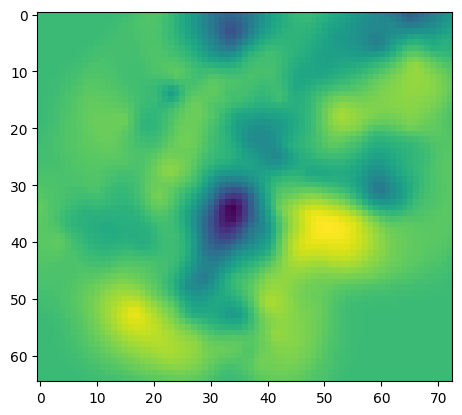

In [238]:
import numpy as np
from pykrige.ok import OrdinaryKriging
from pykrige.uk import UniversalKriging
import matplotlib.pyplot as plt
import geopandas as gpd
g_df = gpd.GeoDataFrame(df, crs="EPSG:4326", geometry=gpd.points_from_xy(df["LONGNUM"], df["LATNUM"]))

g_df = g_df.to_crs("EPSG:3347")
g_df["Easting"], g_df["Northing"] = g_df.geometry.x, g_df.geometry.y
resolution = 5000  # cell size in meters
gridx = np.arange(g_df.bounds.minx.min(), g_df.bounds.maxx.max(), resolution)
gridy = np.arange(g_df.bounds.miny.min(), g_df.bounds.maxy.max(), resolution)

# Interpolate
krig = OrdinaryKriging(x=g_df["Easting"], y=g_df["Northing"], z=g_df[target], variogram_model="spherical",
                       )
z, ss = krig.execute("grid", gridx, gridy)
z= z.clip(0,1)
plt.imshow(z);

In [239]:
import itertools
import numpy as np
import pandas as pd
from shapely.geometry import Polygon

def pixel2poly(x, y, z, resolution):
    """
    x: x coords of cell
    y: y coords of cell
    z: matrix of values for each (x,y)
    resolution: spatial resolution of each cell
    """
    polygons = []
    values = []
    half_res = resolution / 2
    for i, j  in (itertools.product(range(len(x)), range(len(y)))):
        minx, maxx = x[i] - half_res, x[i] + half_res
        miny, maxy = y[j] - half_res, y[j] + half_res
        polygons.append(Polygon([(minx, miny), (minx, maxy), (maxx, maxy), (maxx, miny)]))
        if isinstance(z, (int, float)):
            values.append(z)
        else:
            values.append(z[j, i])
    return polygons, values

In [240]:
import osmnx as ox
import plotly.express as px
polygons, values = pixel2poly(gridx, gridy, z, resolution)
country_model = (gpd.GeoDataFrame({'Prediction': values}, geometry=polygons, crs="EPSG:3347")
                   .to_crs("EPSG:4326")
               )
kenya = ox.geocode_to_gdf("Rwanda")
country_model = gpd.clip(country_model, kenya)
fig = px.choropleth_mapbox(country_model, geojson=country_model.geometry, locations=country_model.index,
                           color='Prediction', color_continuous_scale="Viridis",
                           range_color=[0.1,0.9],
                           center={"lat": -1.9403, "lon": 29.5039}, zoom=7.2,
                           mapbox_style="white-bg")

fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))
fig.update_traces(marker_line_width=0)
import plotly.graph_objects as go
# New code to add Admin Level 1 boundaries
# Step 1: Obtain the boundaries
# read geojson
admin1_gdf = gpd.read_file("Rwanda_Admin_Level_2.geojson")


# Add boundaries to the map with conversion to standard array types
for idx, row in admin1_gdf.iterrows():
    geometry = row.geometry
    if geometry.geom_type == 'Polygon':
        x, y = geometry.exterior.xy
        fig.add_trace(go.Scattermapbox(
            lon=np.array(x).tolist(),
            lat=np.array(y).tolist(),
            mode='lines',
            line=dict(color='black', width=1),
            showlegend=False
        ))
    elif geometry.geom_type == 'MultiPolygon':
        for geom in geometry.geoms:
            x, y = geom.exterior.xy
            fig.add_trace(go.Scattermapbox(
                lon=np.array(x).tolist(),
                lat=np.array(y).tolist(),
                mode='lines',
                line=dict(color='black', width=1),
                showlegend=False
            ))
marker_lats = df[df['label'] == 'train']['LATNUM']
marker_lons = df[df['label'] == 'train']['LONGNUM']
# Add markers to the map
# fig.add_trace(go.Scattermapbox(
#     lat=marker_lats,
#     lon=marker_lons,
#     mode='markers+text',
#     marker=go.scattermapbox.Marker(size=6, color='navy'),
#     textposition="bottom right",
#     showlegend=False
# ))
# marker_lats = df[df['label'] == 'test']['LATNUM']
# marker_lons = df[df['label'] == 'test']['LONGNUM']
# # Add markers to the map
# fig.add_trace(go.Scattermapbox(
#     lat=marker_lats,
#     lon=marker_lons,
#     mode='markers+text',
#     marker=go.scattermapbox.Marker(size=6, color='orange'),
#     textposition="bottom right",
#     showlegend=False
# ))

fig.show()